In [69]:
import pandas as pd
import numpy as np
import Levenshtein
import re
from  translate import Translator
from sklearn.cluster import KMeans
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score
from tensorflow.keras.layers import Input, Dense, Lambda, Layer
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mse
import tensorflow as tf
import matplotlib.pyplot as plt

translator = Translator(to_lang="en")


In [70]:
unique = pd.read_csv("../dataset/result_cleaning_data.csv")
data = pd.read_csv("../dataset/cleaned_data.csv")

print(unique.head())
print(data.head())

C:\Users\Rizal\AppData\Local\Temp\ipykernel_20508\1811373139.py:2: DtypeWarning: Columns (194,195,196,250,258,261,262,263,270,271,272,273,274,275,317,330,332,333,337,338,339,340,344,345,346,347,351,352,353,354,358,359,360,361,365,366,367,368,372,373,374,375,379,380,381,382,384,385,386,387,389,390,408,460,469,478,485,487,488,494,495,496,497,498,503,504,505,506,507,512,513,514,515,516,521,522,523,524,525,528,529,530,531,532,613,622,624,625,626,646,647,648,649,650,651,659,660,661,662,663,668,669,670,671,672,677,678,679,680,681,691,692,696,697,702,703,704,709,710,711,718,719,720,727,728,729,736,737,738,746,747,748,749,750,755,756,757,758,759,764,765,766,767,768,773,774,775,776,777,782,783,784,785,786,791,792,793,794,795,800,801,802,803,804,809,810,811,812,813,818,819,820,821,822,827,828,829,830,831,836,837,838,839,840,845,846,847,848,849,850,851,860,861,862,866,867,868,872,873,874,875,876,877,878,879,880,881,882,883,884,885,899,900,901,906,907,908,913,914,915,920,921,922,927,928,929,934,93

   Unnamed: 0                      0                  1           2  \
0           0      software engineer             intern     manager   
1           1       computer science            general  management   
2           2  boy scouts of america           sciences  technology   
3           3  boy scouts of america           sciences  technology   
4           4                   inc.  software engineer       owner   

                         3                        4                       5  \
0       research assistant                 director         project manager   
1  business administration                  finance  mechanical engineering   
2        purdue university  the university of texas           college board   
3        purdue university  the university of texas           college board   
4                      llc                  founder                director   

                        6                         7                         8  \
0                

**experiences/{j}/title**

In [71]:
data["education/0/field_of_study"]

0                                     Criminal  Justice
1                                                   NaN
2                            Human Computer Interaction
3                                                   NaN
4                        Biomedical/Medical Engineering
                             ...                       
8934           Communications & International Relations
8935    Business Administration and Management, General
8936                                                NaN
8937           Computer Animation, Culture, and English
8938                                                NaN
Name: education/0/field_of_study, Length: 8939, dtype: object

In [72]:
max_num = 0
for i in range(83):
    try:
        print(data[f"education/{i}/field_of_study"])
    except:
        break
    max_num = i

max_num

0                                     Criminal  Justice
1                                                   NaN
2                            Human Computer Interaction
3                                                   NaN
4                        Biomedical/Medical Engineering
                             ...                       
8934           Communications & International Relations
8935    Business Administration and Management, General
8936                                                NaN
8937           Computer Animation, Culture, and English
8938                                                NaN
Name: education/0/field_of_study, Length: 8939, dtype: object
0                                                     NaN
1                                  International Business
2                                        Computer Science
3                                                     NaN
4                                Mechatronics Engineering
                              ..

29

In [73]:
data = data[[f"education/{i}/field_of_study"  if i > 0 else "full_name" for i in range(29)]]

data

,full_name,education/1/field_of_study,education/2/field_of_study,education/3/field_of_study,education/4/field_of_study,education/5/field_of_study,education/6/field_of_study,education/7/field_of_study,education/8/field_of_study,education/9/field_of_study,...,education/19/field_of_study,education/20/field_of_study,education/21/field_of_study,education/22/field_of_study,education/23/field_of_study,education/24/field_of_study,education/25/field_of_study,education/26/field_of_study,education/27/field_of_study,education/28/field_of_study
0,Jeff B.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Andrew Bailey,International Business,Spanish Language and Literature,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Alex Cabrera,Computer Science,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Alcino de Oliveira Manuel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Ali Farhat,Mechatronics Engineering,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8934,Aaron Dolores,International/Global Studies,General Studies,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8935,"Aaron Dominy, MBA","Business Administration and Management, General",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8936,Aaron Williams,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8937,Aaron Dona,"Animation, Interactive Technology, Video Graph...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
colomns = unique.iloc[1].dropna()
colomns

Unnamed: 0                                          1
0                                    computer science
1                                             general
2                                          management
3                             business administration
                               ...                   
1101                   aerospace engineering sciences
1102                                  optical science
1103                             emergency management
1104          international relations:  social theory
1105                                global governance
Name: 1, Length: 1107, dtype: object

In [75]:
colomns = [str(col) for col in colomns.to_list()]
colomns

['1',
 'computer science',
 'general',
 'management',
 'business administration',
 'finance',
 'mechanical engineering',
 'marketing',
 'economics',
 'accounting',
 'electrical',
 'computer engineering',
 'information technology',
 'psychology',
 'business',
 'electronics',
 'electrical engineering',
 'mathematics',
 'engineering',
 'electronics engineering',
 'political science',
 'biology',
 'communication',
 'physics',
 'general studies',
 'graphic design',
 'science',
 'management information systems',
 'literature',
 'chemistry',
 'computer',
 'english',
 'sociology',
 'communications engineering',
 'information systems',
 'international business',
 'chemical engineering',
 'architecture',
 'government',
 'journalism',
 'business analytics',
 'civil engineering',
 'law',
 'media studies',
 'industrial engineering',
 'computer software engineering',
 'history',
 'english language',
 'biochemistry',
 'communications',
 'business management',
 'biomedical engineering',
 'advertising'

Pencarian kedekatan dengan menggunakan cosine similarity\
Cosine Similarity mengukur kesamaan antara dua vektor dengan mengukur sudut kosinus di antara keduanya. Dengan menggunakan TF-IDF (Term Frequency-Inverse Document Frequency), Anda bisa mengonversi kalimat menjadi vektor yang merepresentasikan pentingnya kata-kata dalam kalimat tersebut.

In [76]:

def most_similarity(input_word, data):
    most_similar_word = None
    highest_similarity = -1

    for word in data:
        distance = Levenshtein.distance(input_word, word)
        similarity = 1 - (distance / max(len(input_word), len(word)))

        if similarity > highest_similarity:
            highest_similarity = similarity
            most_similar_word = word

    return most_similar_word

input_word = "kardi"

sample = ["Kardus", "Karpet", "Karikatur"]

output = most_similarity(input_word, sample)

print(output)  


Kardus


In [77]:
def extract_each_title(title_list):
    exp_titles = []
    for exp_title in title_list:
        parts = str(exp_title).lower().replace("and", ",").replace("|", ",").replace("/", ",").replace("&", ",")\
            .replace(" – ", ",").replace(" - ", ",").split(",")
        
        parts = [part.strip() for part in parts]
        
        parts = [part.split(" at ")[0].strip() for part in parts]
        parts = [part.split(" on ")[0].strip() for part in parts]
        parts = [part for part in parts if len(part) > 1]
        parts = [re.sub(r"[()]", "", part) for part in parts]
        parts = [translator.translate(part) for part in parts]
        
        exp_titles.extend(parts)
    # print(exp_titles)
    return exp_titles

title_each_people = [extract_each_title(data.drop(columns="full_name").iloc[i].dropna()) for i in range(len(data))]
title_each_people


[[],
 ['international business', 'spanish language', 'literature'],
 ['computer science'],
 [],
 ['mechatronics engineering'],
 ['finance et banque',
  'sciences économiques banque et finance',
  'sciences économiques',
  'économie et gestion',
  'scientifique d'],
 ['gender studies; victorian',
  'gothic',
  'early american literature',
  'general studies',
  'theatre'],
 ['sociology'],
 ['applied physics',
  'electronics',
  'communication engineering',
  'applied physics',
  'electronics',
  'communication engineering'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['marketing'],
 ['applied human sciences; health', 'exercise science'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['computer science'],
 ['industrial engineering', 'industrial engineering'],
 ['computer science'],
 ['finance'],
 [],
 ['public health', 'liberal arts', 'sciences', 'liberal studies'],
 [],
 ['international business'],
 ['philosophy'],
 [],
 [],
 [],
 ['information systems'],
 [],
 [],
 [],
 ['mechanical engineering'],
 [],

In [78]:
title_each_people = [title for title in title_each_people if len(title) != 0]
title_each_people

[['international business', 'spanish language', 'literature'],
 ['computer science'],
 ['mechatronics engineering'],
 ['finance et banque',
  'sciences économiques banque et finance',
  'sciences économiques',
  'économie et gestion',
  'scientifique d'],
 ['gender studies; victorian',
  'gothic',
  'early american literature',
  'general studies',
  'theatre'],
 ['sociology'],
 ['applied physics',
  'electronics',
  'communication engineering',
  'applied physics',
  'electronics',
  'communication engineering'],
 ['marketing'],
 ['applied human sciences; health', 'exercise science'],
 ['computer science'],
 ['industrial engineering', 'industrial engineering'],
 ['computer science'],
 ['finance'],
 ['public health', 'liberal arts', 'sciences', 'liberal studies'],
 ['international business'],
 ['philosophy'],
 ['information systems'],
 ['mechanical engineering'],
 ['accounting'],
 ['computer'],
 ['business', 'public administration'],
 ['corporate finance'],
 ['computational science',
 

In [79]:
np.zeros(len(colomns))

array([0., 0., 0., ..., 0., 0., 0.])

In [80]:
index_col = {}

for i in range(len(colomns)):
    index_col[colomns[i]] = i

index_col

{'1': 0,
 'computer science': 1,
 'general': 2,
 'management': 3,
 'business administration': 4,
 'finance': 5,
 'mechanical engineering': 6,
 'marketing': 7,
 'economics': 8,
 'accounting': 9,
 'electrical': 10,
 'computer engineering': 11,
 'information technology': 12,
 'psychology': 13,
 'business': 14,
 'electronics': 15,
 'electrical engineering': 16,
 'mathematics': 17,
 'engineering': 18,
 'electronics engineering': 19,
 'political science': 20,
 'biology': 21,
 'communication': 22,
 'physics': 23,
 'general studies': 24,
 'graphic design': 25,
 'science': 26,
 'management information systems': 27,
 'literature': 28,
 'chemistry': 29,
 'computer': 30,
 'english': 31,
 'sociology': 32,
 'communications engineering': 33,
 'information systems': 34,
 'international business': 35,
 'chemical engineering': 36,
 'architecture': 37,
 'government': 38,
 'journalism': 39,
 'business analytics': 40,
 'civil engineering': 41,
 'law': 42,
 'media studies': 43,
 'industrial engineering': 44

In [81]:
def sentences_count(titles):
    frequency = [0 for i in range(len(colomns))]

    normalize_data = [most_similarity(title, colomns) for title in titles]

    for title in normalize_data:
        frequency[index_col[title]] += 1
    return frequency

title_frequencies = [sentences_count(title) for title in title_each_people ]
title_frequencies
    

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [82]:
title_each_people[0]

['international business', 'spanish language', 'literature']

In [83]:
new_data = pd.DataFrame(title_frequencies, columns=colomns).drop(columns="1")
new_data

,computer science,general,management,business administration,finance,mechanical engineering,marketing,economics,accounting,electrical,...,business process management,administrative management,digital film,computer engineering technology,american history,aerospace engineering sciences,optical science,emergency management,international relations: social theory,global governance
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4193,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4196,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [84]:
# Parameter VAE
input_dim = new_data.shape[1]
intermediate_dim = 64
latent_dim = 2

# Encoder
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# Decoder
decoder_h = Dense(intermediate_dim, activation='relu')
decoder_mean = Dense(input_dim, activation='sigmoid')

h_decoded = decoder_h(z)
x_decoded_mean = decoder_mean(h_decoded)

# VAE model
vae = Model(inputs, x_decoded_mean)

# Compute VAE loss
reconstruction_loss = mse(inputs, x_decoded_mean)
reconstruction_loss *= input_dim
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.compile(optimizer='adam')

# Train the VAE
vae.fit(new_data, epochs=100, batch_size=2, shuffle=True)


Epoch 1/100
2099/2099 [==============================] - 24s 7ms/step - loss: 14.1312
Epoch 2/100
2099/2099 [==============================] - 20s 10ms/step - loss: 2.5808
Epoch 3/100
2099/2099 [==============================] - 20s 9ms/step - loss: 2.5446
Epoch 4/100
2099/2099 [==============================] - 20s 9ms/step - loss: 2.5396
Epoch 5/100
2099/2099 [==============================] - 19s 9ms/step - loss: 2.5387
Epoch 6/100
2099/2099 [==============================] - 18s 9ms/step - loss: 2.5381
Epoch 7/100
2099/2099 [==============================] - 19s 9ms/step - loss: 2.5377
Epoch 8/100
2099/2099 [==============================] - 19s 9ms/step - loss: 2.5372
Epoch 9/100
2099/2099 [==============================] - 19s 9ms/step - loss: 2.5371
Epoch 10/100
2099/2099 [==============================] - 17s 8ms/step - loss: 2.5367
Epoch 11/100
2099/2099 [==============================] - 17s 8ms/step - loss: 2.5369
Epoch 12/100
2099/2099 [==============================] - 18s

In [85]:
new_data.shape

(4198, 1106)

In [86]:
# Define encoder model to extract latent space
encoder = Model(inputs, z_mean)

# Ekstraksi fitur kompresi dari latent space
compressed_features = encoder.predict(new_data.to_numpy())
print(compressed_features)


132/132 [==============================] - 1s 4ms/step
[[-0.00403285 -0.00150619]
 [-0.00407343 -0.00109141]
 [-0.00407343 -0.00109141]
 ...
 [-0.00407343 -0.00109141]
 [-0.00378436 -0.00404651]
 [-0.00407343 -0.00109141]]


In [87]:
input_dim = new_data.shape[1]  # Sesuaikan dengan data Anda
intermediate_dim = 500  # Ukuran layer intermediate, dapat disesuaikan
latent_dim = compressed_features.shape[1]  # Dimensi latent space
n_clusters = 3  # Jumlah cluster

# Clustering layer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters

    def build(self, input_shape):
        self.input_dim = input_shape[1]
        self.clusters = self.add_weight(shape=(self.n_clusters, self.input_dim), initializer='glorot_uniform', name='clusters')

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2))
        q **= (self.input_dim + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define DEC model
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# DEC specific layers
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(z)
dec = Model(inputs, clustering_layer)

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(compressed_features)
dec.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

# Custom training loop
optimizer = SGD(0.01, 0.9)

# Convert inputs to TensorFlow variable
X_tf = tf.convert_to_tensor(new_data.to_numpy(), dtype=tf.float32)

epochs = 100
batch_size = 2

for epoch in range(epochs):
    with tf.GradientTape() as tape:
        q = dec(X_tf)
        p = tf.pow(q, 2) / tf.reduce_sum(q, axis=0)
        p /= tf.reduce_sum(p, axis=1, keepdims=True)
        loss = tf.reduce_mean(tf.keras.losses.KLD(p, q))
    grads = tape.gradient(loss, dec.trainable_weights)
    optimizer.apply_gradients(zip(grads, dec.trainable_weights))
    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.numpy()}')

# Assign clusters to data points
q = dec.predict(new_data.to_numpy())
y_pred_final = q.argmax(1)

# Menampilkan hasil clustering
new_data['Cluster'] = y_pred_final
print(new_data)

Epoch 0, Loss: 5.410048288467806e-06
Epoch 10, Loss: 4.180003088549711e-06
Epoch 20, Loss: 2.443664925522171e-06
Epoch 30, Loss: 1.2631462595891207e-06
Epoch 40, Loss: 5.831444696013932e-07
Epoch 50, Loss: 2.4226756067946553e-07
Epoch 60, Loss: 9.412620727289323e-08
Epoch 70, Loss: 3.078714527759985e-08
Epoch 80, Loss: 7.883815378306736e-09
Epoch 90, Loss: -3.341259935396579e-09
132/132 [==============================] - 3s 18ms/step
      computer science  general  management  business administration  finance  \
0                    0        0           0                        0        0   
1                    1        0           0                        0        0   
2                    0        0           0                        0        0   
3                    0        0           0                        0        0   
4                    0        0           0                        0        0   
...                ...      ...         ...                      ...      ..

In [88]:
print(compressed_features.shape)  # Pastikan ini sesuai dengan latent_dim yang diharapkan


(4198, 2)


In [89]:
new_data["Cluster"].value_counts()

Cluster
2    2225
0    1971
1       2
Name: count, dtype: int64

In [90]:
# Menghitung Silhouette Score
score = silhouette_score(compressed_features, y_pred_final)
print(f'Silhouette Score: {score}')


Silhouette Score: -0.034847017377614975


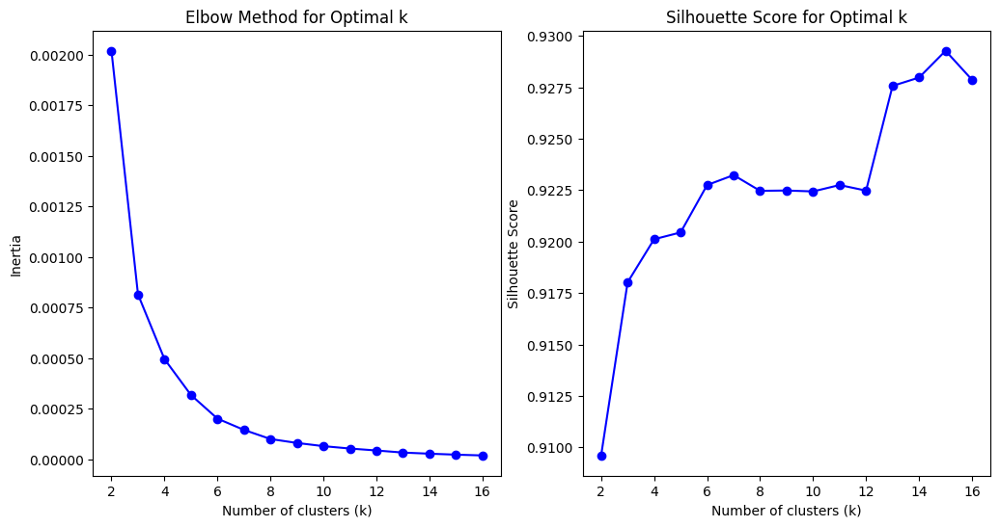

Best k based on Silhouette Score: 15


In [91]:
def find_best_k(data, max_k=16):
    inertia = []
    silhouette_scores = []

    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, n_init=20)
        kmeans.fit(data)
        
        # Append inertia (within-cluster sum of squares)
        inertia.append(kmeans.inertia_)
        
        # Compute silhouette score
        score = silhouette_score(data, kmeans.labels_)
        silhouette_scores.append(score)

    # Plotting the Elbow Method
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(range(2, max_k + 1), inertia, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k')

    # Plotting the Silhouette Score
    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_k + 1), silhouette_scores, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal k')

    plt.show()

    # Best k based on silhouette score
    best_k = silhouette_scores.index(max(silhouette_scores)) + 2
    print(f'Best k based on Silhouette Score: {best_k}')

    return best_k

# Assuming compressed_features is your data after feature extraction
best_k = find_best_k(compressed_features, max_k=16)

In [94]:
input_dim = new_data.shape[1]  # Sesuaikan dengan data Anda
intermediate_dim = 500  # Ukuran layer intermediate, dapat disesuaikan
latent_dim = compressed_features.shape[1]  # Dimensi latent space
n_clusters = 5  # Jumlah cluster


# Define DEC model
inputs = Input(shape=(input_dim,))
h = Dense(intermediate_dim, activation='relu')(inputs)

z_mean = Dense(latent_dim)(h)
z_log_var = Dense(latent_dim)(h)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

# DEC specific layers
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(z)
dec = Model(inputs, clustering_layer)

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(compressed_features)
dec.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

# Custom training loop
optimizer = SGD(0.01, 0.9)

# Convert inputs to TensorFlow variable
X_tf = tf.convert_to_tensor(new_data.to_numpy(), dtype=tf.float32)

epochs = 100
batch_size = 2

for epoch in range(epochs):
    with tf.GradientTape() as tape:
        q = dec(X_tf)
        p = tf.pow(q, 2) / tf.reduce_sum(q, axis=0)
        p /= tf.reduce_sum(p, axis=1, keepdims=True)
        loss = tf.reduce_mean(tf.keras.losses.KLD(p, q))
    grads = tape.gradient(loss, dec.trainable_weights)
    optimizer.apply_gradients(zip(grads, dec.trainable_weights))
    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.numpy()}')

# Assign clusters to data points
q = dec.predict(new_data.to_numpy())
y_pred_final = q.argmax(1)

# Menampilkan hasil clustering
new_data['Cluster'] = y_pred_final
print(new_data)

Epoch 0, Loss: 6.907993792992784e-06
Epoch 10, Loss: 5.8914529290632345e-06
Epoch 20, Loss: 4.3072705011582e-06
Epoch 30, Loss: 3.0831308777123922e-06
Epoch 40, Loss: 2.0288509858801262e-06
Epoch 50, Loss: 1.3469085615724907e-06
Epoch 60, Loss: 8.816590479909792e-07
Epoch 70, Loss: 5.782846983493073e-07
Epoch 80, Loss: 3.726644877133367e-07
Epoch 90, Loss: 2.4246287466667127e-07
132/132 [==============================] - 3s 12ms/step
      computer science  general  management  business administration  finance  \
0                    0        0           0                        0        0   
1                    1        0           0                        0        0   
2                    0        0           0                        0        0   
3                    0        0           0                        0        0   
4                    0        0           0                        0        0   
...                ...      ...         ...                      ...      ..

In [95]:
vae.save('../model/edu/vae_model.h5')
dec.save('../model/edu/dec_model.h5')

c:\Users\Rizal\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
